# Data import

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` ex

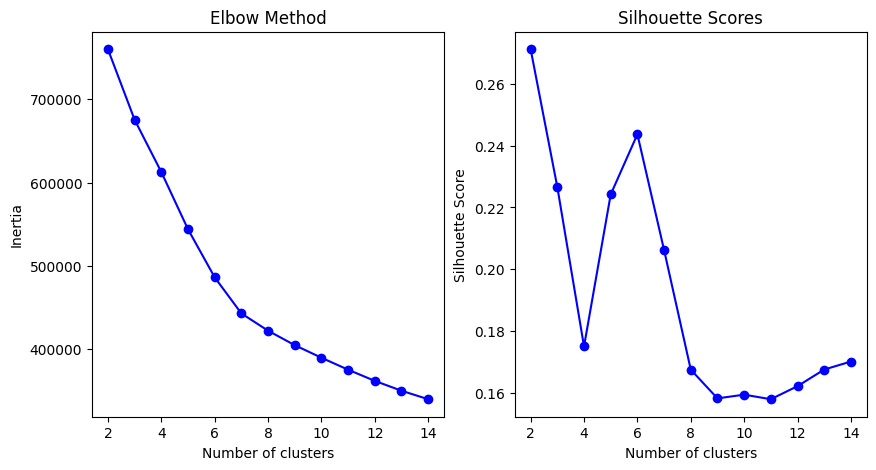

In [ ]:
# @title
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

# Load the dataset using the raw URL
data_url = 'https://raw.githubusercontent.com/aeckumich/siads696_M2/main/data/datawithgenres.csv'
data = pd.read_csv(data_url)

# Select relevant features for clustering
features = data[['speechiness', 'acousticness', 'instrumentalness', 'loudness', 'liveness', 'danceability', 'energy', 'tempo']]

# Normalize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Determine the optimal number of clusters using the Elbow method
inertia = []
silhouette_scores = []
K = range(2, 15)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_features)
    inertia.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(scaled_features, kmeans.labels_))

# Plot the Elbow Method graph
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(K, inertia, 'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')

# Plot Silhouette scores
plt.subplot(1, 2, 2)
plt.plot(K, silhouette_scores, 'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores')
plt.show()


# 5 Clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 0:
speechiness         2.163683
acousticness       -0.254799
instrumentalness   -0.368396
loudness            0.237723
liveness           -0.045070
danceability        0.625084
energy              0.168565
tempo               0.021037
dtype: float64


Cluster 1:
speechiness         0.085896
acousticness       -0.275740
instrumentalness   -0.080716
loudness            0.271986
liveness            2.761640
danceability       -0.365771
energy              0.522888
tempo               0.083727
dtype: float64


Cluster 2:
speechiness        -0.427753
acousticness        1.073388
instrumentalness   -0.351763
loudness           -0.481065
liveness           -0.270449
danceability       -0.332588
energy             -0.957327
tempo              -0.215417
dtype: float64


Cluster 3:
speechiness        -0.292869
acousticness       -0.592038
instrumentalness   -0.073176
loudness            0.428569
liveness           -0.213457
danceability        0.199846
energy              0.544860
tempo 

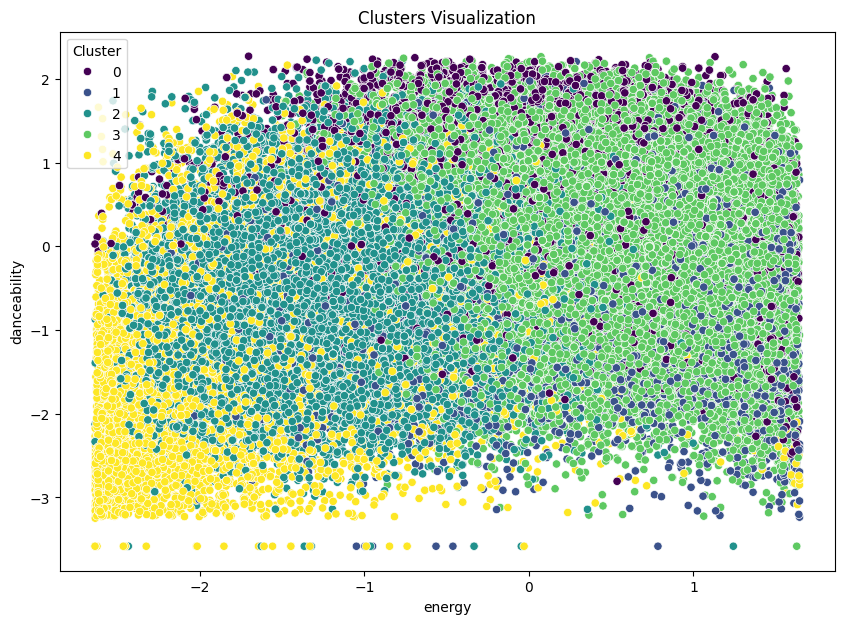

In [ ]:
import seaborn as sns
k_optimal = 5
kmeans = KMeans(n_clusters=k_optimal, random_state=42)
clusters = kmeans.fit_predict(scaled_features)

# Add the cluster labels to the original data
data['cluster'] = clusters

# Analyze the clusters to assign mood/vibe labels
# This can be done by inspecting the mean feature values for each cluster
for i in range(k_optimal):
    print(f"Cluster {i}:")
    print(data[data['cluster'] == i][['speechiness', 'acousticness', 'instrumentalness', 'loudness', 'liveness', 'danceability', 'energy', 'tempo']].mean())
    print("\n")


# Define a function to plot the clusters
def plot_clusters(data, features, clusters):
    plt.figure(figsize=(10, 7))
    sns.scatterplot(x=features[0], y=features[1], hue=clusters, palette="viridis", data=data, legend="full")
    plt.title('Clusters Visualization')
    plt.xlabel(features[0])
    plt.ylabel(features[1])
    plt.legend(title='Cluster')
    plt.show()

# Select two features for the scatter plot
plot_features = ['energy', 'danceability']

# Plot the clusters
plot_clusters(data, plot_features, data['cluster'])


# 3 Clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 0:
speechiness        -0.435405
acousticness        1.328267
instrumentalness    0.473095
loudness           -1.093108
liveness           -0.176976
danceability       -0.665132
energy             -1.279367
tempo              -0.282079
dtype: float64


Cluster 1:
speechiness        -0.305183
acousticness       -0.469659
instrumentalness   -0.105945
loudness            0.374770
liveness            0.022212
danceability        0.136321
energy              0.458701
tempo               0.106569
dtype: float64


Cluster 2:
speechiness         2.110169
acousticness       -0.247931
instrumentalness   -0.359345
loudness            0.255914
liveness            0.211402
danceability        0.561014
energy              0.210820
tempo               0.022474
dtype: float64




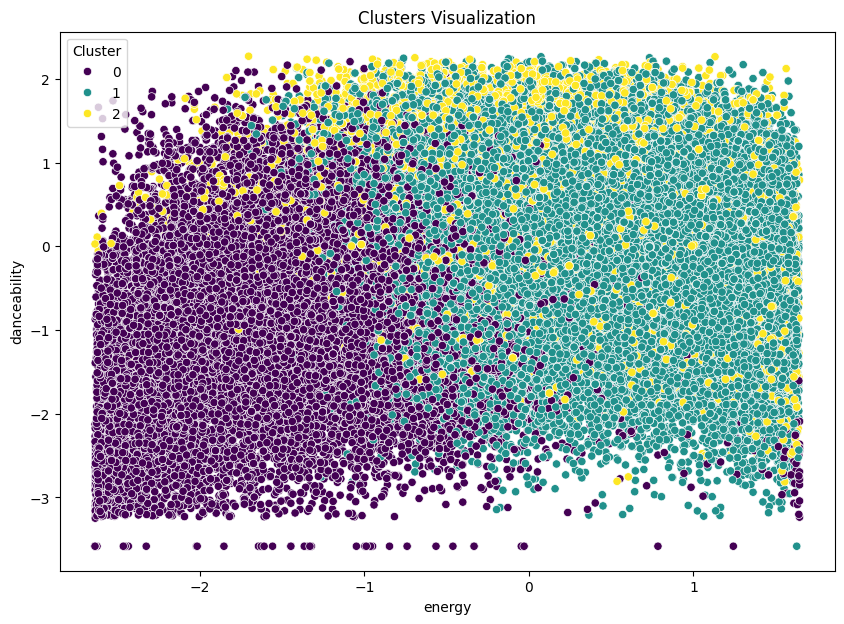

In [ ]:
k_optimal = 3
kmeans = KMeans(n_clusters=k_optimal, random_state=42)
clusters = kmeans.fit_predict(scaled_features)

# Add the cluster labels to the original data
data['cluster'] = clusters

# Analyze the clusters to assign mood/vibe labels
# This can be done by inspecting the mean feature values for each cluster
for i in range(k_optimal):
    print(f"Cluster {i}:")
    print(data[data['cluster'] == i][['speechiness', 'acousticness','instrumentalness', 'loudness', 'liveness', 'danceability', 'energy', 'tempo']].mean())
    print("\n")

plot_features = ['energy', 'danceability']

# Plot the clusters
plot_clusters(data, plot_features, data['cluster'])

# 10 Clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 0:
speechiness        -0.450906
acousticness        1.871580
instrumentalness    2.395480
loudness           -3.955210
liveness           -0.390100
danceability       -1.983979
energy             -2.334003
tempo              -0.678274
dtype: float64


Cluster 1:
speechiness        -0.327079
acousticness       -0.690016
instrumentalness   -0.390481
loudness            0.599105
liveness           -0.012071
danceability       -0.017738
energy              0.795631
tempo              -0.322005
dtype: float64


Cluster 2:
speechiness        -0.435302
acousticness        1.252910
instrumentalness   -0.382267
loudness           -0.646311
liveness           -0.243565
danceability       -0.489219
energy             -1.160879
tempo              -0.941079
dtype: float64


Cluster 3:
speechiness         2.372543
acousticness       -0.234840
instrumentalness   -0.405403
loudness            0.224934
liveness           -0.007401
danceability        0.626518
energy              0.161983
tempo 

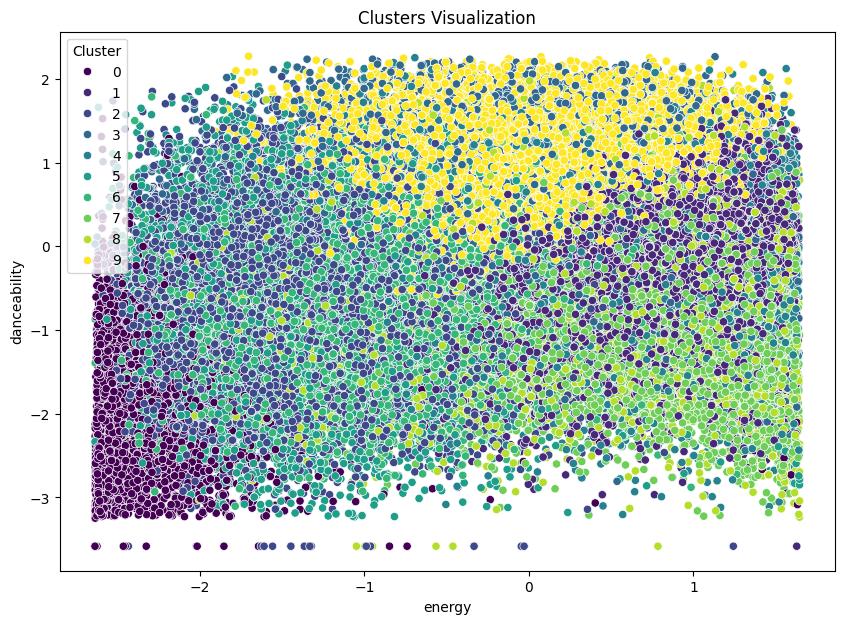

In [ ]:

k_optimal = 10
kmeans = KMeans(n_clusters=k_optimal, random_state=42)
clusters = kmeans.fit_predict(scaled_features)

# Add the cluster labels to the original data
data['cluster'] = clusters

# Analyze the clusters to assign mood/vibe labels
# This can be done by inspecting the mean feature values for each cluster
for i in range(k_optimal):
    print(f"Cluster {i}:")
    print(data[data['cluster'] == i][['speechiness', 'acousticness', 'instrumentalness', 'loudness', 'liveness', 'danceability', 'energy', 'tempo']].mean())
    print("\n")

plot_features = ['energy', 'danceability']

# Plot the clusters
plot_clusters(data, plot_features, data['cluster'])


# 15 Clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 0:
speechiness        -0.213810
acousticness       -0.674404
instrumentalness   -0.360776
loudness            0.565017
liveness           -0.133028
danceability       -0.787597
energy              0.750356
tempo               1.337321
dtype: float64


Cluster 1:
speechiness        -0.473744
acousticness        1.538788
instrumentalness   -0.370144
loudness           -1.013395
liveness           -0.238529
danceability       -0.773087
energy             -1.551253
tempo              -0.834829
dtype: float64


Cluster 2:
speechiness        -0.236168
acousticness       -0.505019
instrumentalness   -0.354283
loudness           -0.150527
liveness           -0.417914
danceability        0.948741
energy             -0.345562
tempo              -0.083880
dtype: float64


Cluster 3:
speechiness         0.164011
acousticness       -0.069207
instrumentalness   -0.111663
loudness            0.139834
liveness            3.483409
danceability       -0.445735
energy              0.383472
tempo 

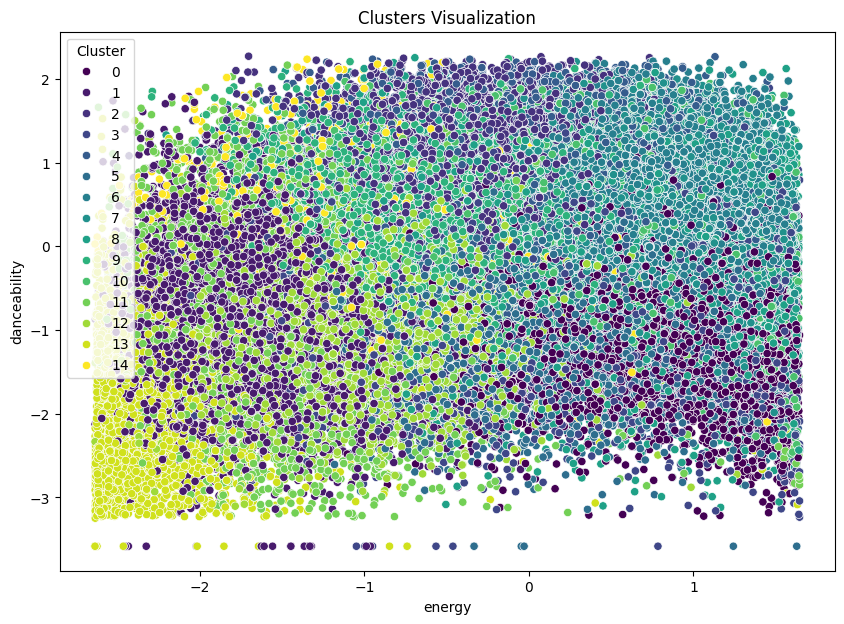

In [ ]:

k_optimal = 15
kmeans = KMeans(n_clusters=k_optimal, random_state=42)
clusters = kmeans.fit_predict(scaled_features)

# Add the cluster labels to the original data
data['cluster'] = clusters

# Analyze the clusters to assign mood/vibe labels
# This can be done by inspecting the mean feature values for each cluster
for i in range(k_optimal):
    print(f"Cluster {i}:")
    print(data[data['cluster'] == i][['speechiness', 'acousticness', 'instrumentalness', 'loudness', 'liveness', 'danceability', 'energy', 'tempo']].mean())
    print("\n")


plot_features = ['energy', 'danceability']

# Plot the clusters
plot_clusters(data, plot_features, data['cluster'])


# 25 Clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 0:
speechiness         4.430190
acousticness        0.951809
instrumentalness   -0.337768
loudness           -1.165300
liveness            0.298281
danceability        0.403351
energy             -0.982867
tempo              -0.320148
dtype: float64


Cluster 1:
speechiness        -0.094942
acousticness       -0.789949
instrumentalness   -0.372113
loudness            0.665499
liveness            0.094555
danceability       -1.157442
energy              0.977141
tempo               1.555503
dtype: float64


Cluster 2:
speechiness        -0.420098
acousticness        1.399383
instrumentalness   -0.326044
loudness           -0.636710
liveness           -0.258346
danceability       -1.074048
energy             -1.175593
tempo               1.426399
dtype: float64


Cluster 3:
speechiness        -0.344985
acousticness        1.157274
instrumentalness    2.366813
loudness           -0.816616
liveness           -0.314291
danceability        0.109350
energy             -0.811470
tempo 

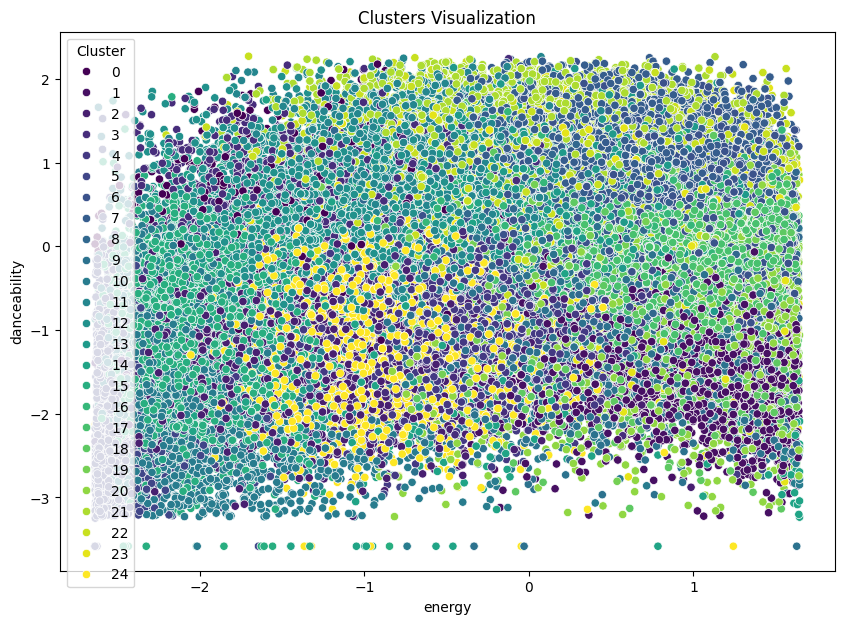

In [ ]:
k_optimal = 25
kmeans = KMeans(n_clusters=k_optimal, random_state=42)
clusters = kmeans.fit_predict(scaled_features)

# Add the cluster labels to the original data
data['cluster'] = clusters

# Analyze the clusters to assign mood/vibe labels
# This can be done by inspecting the mean feature values for each cluster
for i in range(k_optimal):
    print(f"Cluster {i}:")
    print(data[data['cluster'] == i][['speechiness', 'acousticness', 'instrumentalness', 'loudness', 'liveness', 'danceability', 'energy', 'tempo']].mean())
    print("\n")


plot_features = ['energy', 'danceability']

# Plot the clusters
plot_clusters(data, plot_features, data['cluster'])


# 50 Clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 0:
speechiness        -0.395919
acousticness        1.141034
instrumentalness    2.296814
loudness           -0.446430
liveness           -0.303270
danceability        0.338799
energy             -0.436590
tempo              -0.470004
dtype: float64


Cluster 1:
speechiness        -0.520583
acousticness       -0.390988
instrumentalness   -0.359657
loudness           -0.142464
liveness           -0.296901
danceability       -1.014735
energy             -0.412486
tempo               0.875265
dtype: float64


Cluster 2:
speechiness        -0.388679
acousticness        0.838242
instrumentalness   -0.404885
loudness           -0.089298
liveness            1.105338
danceability       -0.145921
energy             -0.268435
tempo              -0.076767
dtype: float64


Cluster 3:
speechiness        -0.345943
acousticness       -0.490077
instrumentalness   -0.408971
loudness            0.299477
liveness           -0.443450
danceability        0.506750
energy              0.017820
tempo 

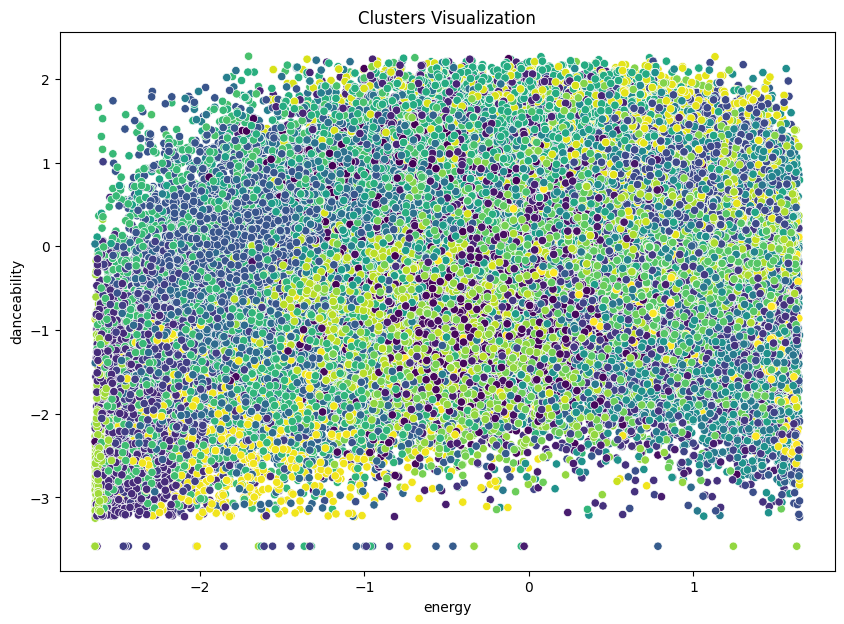

In [ ]:
k_optimal = 50
kmeans = KMeans(n_clusters=k_optimal, random_state=42)
clusters = kmeans.fit_predict(scaled_features)

# Add the cluster labels to the original data
data['cluster'] = clusters

# Analyze the clusters to assign mood/vibe labels
# This can be done by inspecting the mean feature values for each cluster
for i in range(k_optimal):
    print(f"Cluster {i}:")
    print(data[data['cluster'] == i][['speechiness', 'acousticness', 'instrumentalness', 'loudness', 'liveness', 'danceability', 'energy', 'tempo']].mean())
    print("\n")

import matplotlib.pyplot as plt
import seaborn as sns

# Define a function to plot the clusters without legend
def plot_clusters_no_legend(data, features, clusters):
    plt.figure(figsize=(10, 7))
    sns.scatterplot(x=features[0], y=features[1], hue=clusters, palette="viridis", data=data, legend=None)
    plt.title('Clusters Visualization')
    plt.xlabel(features[0])
    plt.ylabel(features[1])
    plt.show()

# Select two features for the scatter plot
plot_features = ['energy', 'danceability']

# Plot the clusters without legend
plot_clusters_no_legend(data, plot_features, data['cluster'])



# 75 Clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 0:
speechiness        -0.404362
acousticness        1.184239
instrumentalness    2.308074
loudness           -0.409816
liveness           -0.301565
danceability        0.311055
energy             -0.374765
tempo              -0.401498
dtype: float64


Cluster 1:
speechiness        -0.427429
acousticness        0.628663
instrumentalness   -0.410251
loudness            0.409724
liveness           -0.347870
danceability       -0.235340
energy              0.295946
tempo               0.305375
dtype: float64


Cluster 2:
speechiness         1.653077
acousticness       -0.558231
instrumentalness   -0.409249
loudness            0.519794
liveness            1.076735
danceability        0.620222
energy              0.636190
tempo               0.767239
dtype: float64


Cluster 3:
speechiness        -0.386478
acousticness       -0.525430
instrumentalness   -0.370266
loudness           -0.239886
liveness            0.930868
danceability        0.419331
energy             -0.249641
tempo 

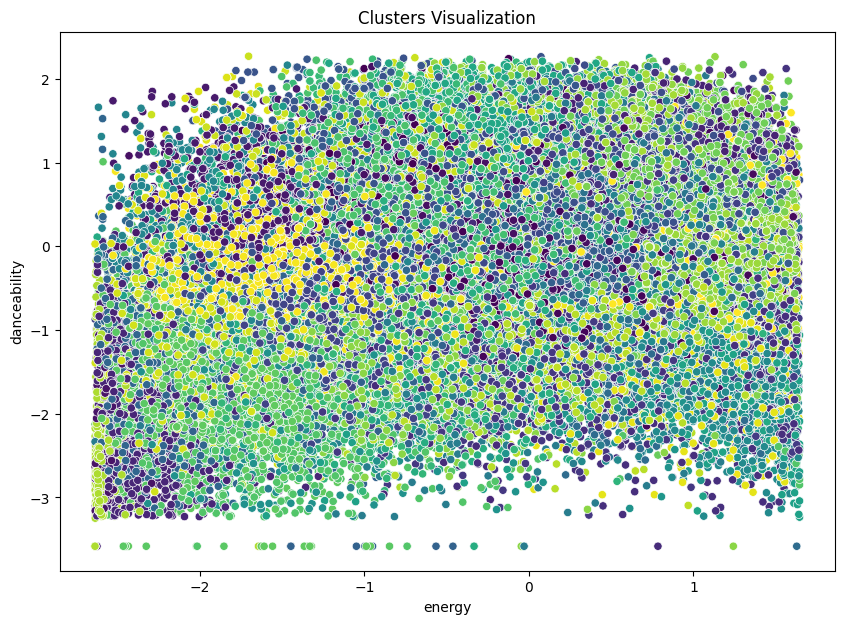

In [ ]:
k_optimal = 75
kmeans = KMeans(n_clusters=k_optimal, random_state=42)
clusters = kmeans.fit_predict(scaled_features)

# Add the cluster labels to the original data
data['cluster'] = clusters

# Analyze the clusters to assign mood/vibe labels
# This can be done by inspecting the mean feature values for each cluster
for i in range(k_optimal):
    print(f"Cluster {i}:")
    print(data[data['cluster'] == i][['speechiness', 'acousticness', 'instrumentalness', 'loudness', 'liveness', 'danceability', 'energy', 'tempo']].mean())
    print("\n")


# Select two features for the scatter plot
plot_features = ['energy', 'danceability']

# Plot the clusters without legend
plot_clusters_no_legend(data, plot_features, data['cluster'])

# 100 Clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 0:
speechiness         1.628122
acousticness        0.857887
instrumentalness   -0.430090
loudness            0.103496
liveness           -0.248618
danceability        0.070724
energy             -0.176305
tempo              -1.136219
dtype: float64


Cluster 1:
speechiness         0.452911
acousticness       -0.436480
instrumentalness   -0.434980
loudness            0.646568
liveness           -0.375546
danceability        0.495192
energy              0.572292
tempo               1.727335
dtype: float64


Cluster 2:
speechiness        -0.523589
acousticness        1.647689
instrumentalness   -0.346950
loudness           -1.008311
liveness           -0.382501
danceability       -0.855407
energy             -1.651131
tempo               0.231029
dtype: float64


Cluster 3:
speechiness        -0.333698
acousticness       -0.833433
instrumentalness    2.178541
loudness            0.337929
liveness            1.089760
danceability        0.226237
energy              0.973314
tempo 

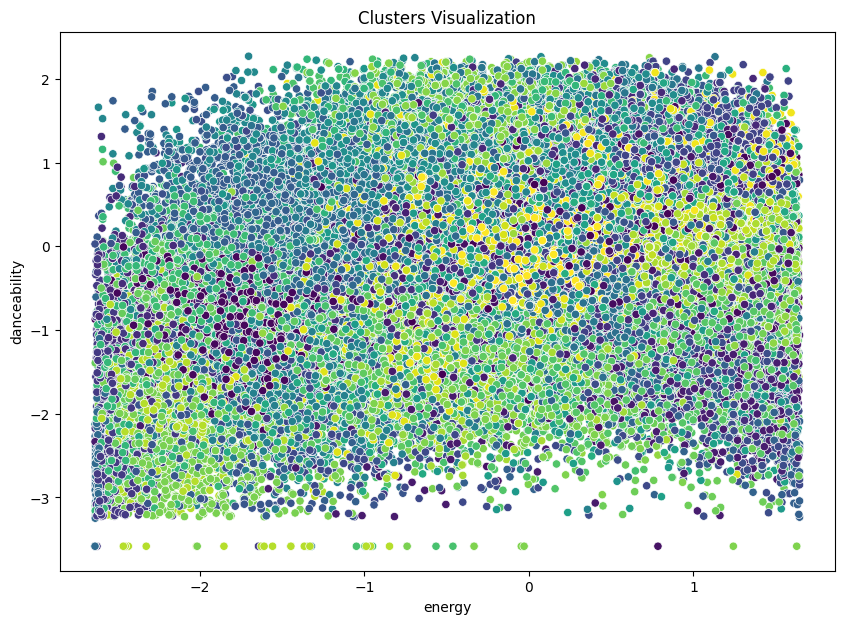

In [ ]:
k_optimal = 100
kmeans = KMeans(n_clusters=k_optimal, random_state=42)
clusters = kmeans.fit_predict(scaled_features)

# Add the cluster labels to the original data
data['cluster'] = clusters

# Analyze the clusters to assign mood/vibe labels
# This can be done by inspecting the mean feature values for each cluster
for i in range(k_optimal):
    print(f"Cluster {i}:")
    print(data[data['cluster'] == i][['speechiness', 'acousticness', 'instrumentalness', 'loudness', 'liveness', 'danceability', 'energy', 'tempo']].mean())
    print("\n")


# Select two features for the scatter plot
plot_features = ['energy', 'danceability']

# Plot the clusters without legend
plot_clusters_no_legend(data, plot_features, data['cluster'])


# Try with PCA

   Unnamed: 0  speechiness  acousticness  duration  instrumentalness  \
0           0    -0.560913     -0.218779  1.349612         -0.465927   
1           1    -0.634437     -0.044115  0.335386         -0.465951   
2           2    -0.660970     -0.514141  0.127104         -0.465985   
3           3    -0.595321     -0.736145  0.841718         -0.423568   
4           4    -0.303741     -0.974216  0.315257         -0.465985   

   loudness  liveness  track_popularity  danceability    energy  ...  \
0  0.789112  0.197152          0.869157      1.169294  0.848730  ...   
1 -0.900463 -0.854370          0.905545      1.003615  0.000527  ...   
2  0.372613 -0.383968          0.541665      0.364564  0.411777  ...   
3  0.875709 -0.744263          1.196650      0.743261  1.028652  ...   
4  0.787860 -0.090350          0.941933      0.364564  1.345658  ...   

                  song_id             playlist_id                song_id1  \
0  2hWI9GNr3kBrxZ7Mphho4Q  3NRoLDaBAinoLTmVHNMGjP  2hWI9G

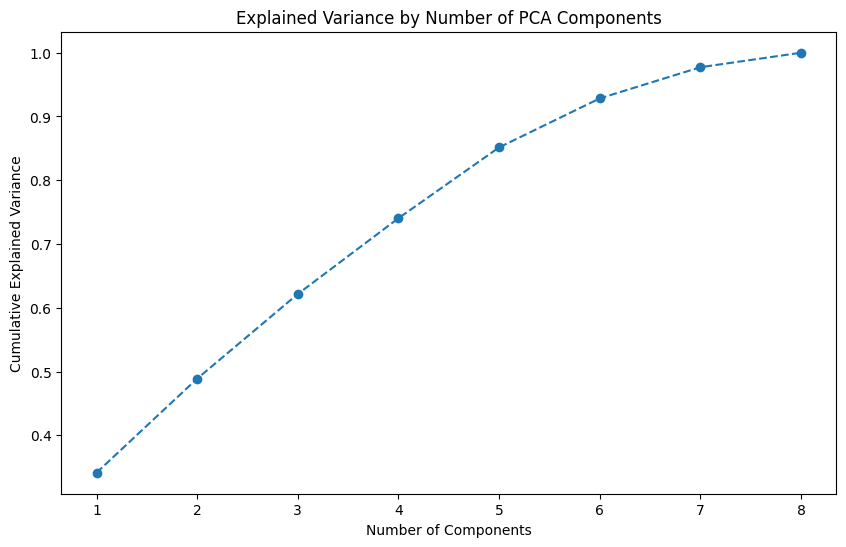

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Load the dataset using the raw URL
data_url = 'https://raw.githubusercontent.com/aeckumich/siads696_M2/main/data/datawithgenres.csv'
data = pd.read_csv(data_url)
print(data.head())
# Select relevant features for clustering
features = data[['speechiness', 'acousticness', 'instrumentalness', 'loudness', 'liveness', 'danceability', 'energy', 'tempo']]

# Normalize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Apply PCA and fit to the data
pca = PCA()
pca.fit(scaled_features)

# Plot cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of PCA Components')
plt.show()


# PCA 5

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


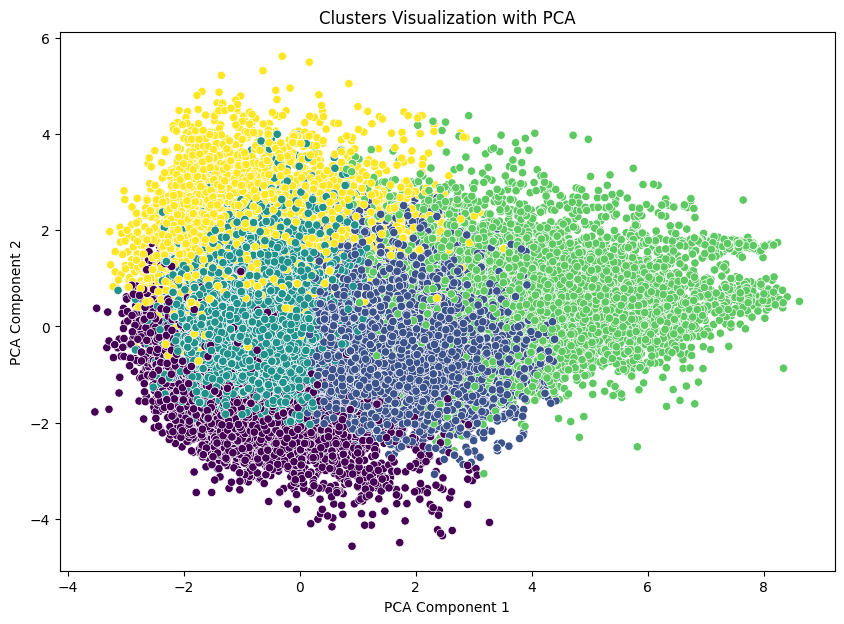

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns


# Normalize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Apply PCA with the chosen number of components
n_components_optimal = 5
pca = PCA(n_components=n_components_optimal)
pca_features = pca.fit_transform(scaled_features)

# Perform K-means clustering on the PCA-transformed features
k_optimal = 5  # Adjust this based on your optimal number of clusters
kmeans_pca = KMeans(n_clusters=k_optimal, random_state=42)
clusters_pca = kmeans_pca.fit_predict(pca_features)

# Add the PCA components and cluster labels to the original data
for i in range(n_components_optimal):
    data[f'pca{i+1}'] = pca_features[:, i]
data['cluster_pca'] = clusters_pca

# Plot the PCA-transformed features with cluster labels for the first two components
plt.figure(figsize=(10, 7))
sns.scatterplot(x='pca1', y='pca2', hue='cluster_pca', palette='viridis', data=data, legend=None)
plt.title('Clusters Visualization with PCA')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()



# PCA 3

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


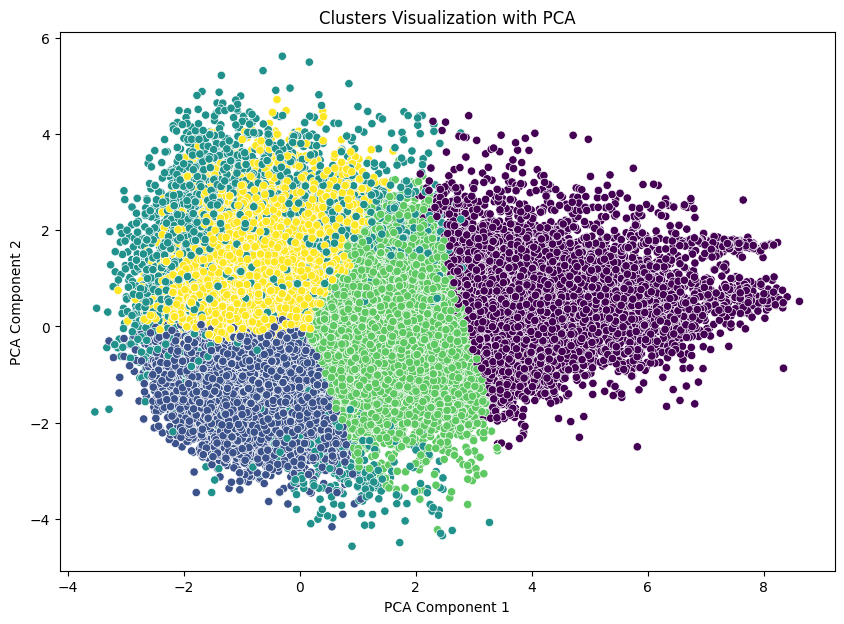

In [ ]:

n_components_optimal = 3
pca = PCA(n_components=n_components_optimal)
pca_features = pca.fit_transform(scaled_features)

# Perform K-means clustering on the PCA-transformed features
k_optimal = 5  # Adjust this based on your optimal number of clusters
kmeans_pca = KMeans(n_clusters=k_optimal, random_state=42)
clusters_pca = kmeans_pca.fit_predict(pca_features)

# Add the PCA components and cluster labels to the original data
for i in range(n_components_optimal):
    data[f'pca{i+1}'] = pca_features[:, i]
data['cluster_pca'] = clusters_pca

# Plot the PCA-transformed features with cluster labels for the first two components
plt.figure(figsize=(10, 7))
sns.scatterplot(x='pca1', y='pca2', hue='cluster_pca', palette='viridis', data=data, legend=None)
plt.title('Clusters Visualization with PCA')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()


# PCA 7/LABELING SONGS!

             speechiness  acousticness  instrumentalness  loudness  liveness  \
cluster_pca                                                                    
0               2.186077     -0.247648         -0.400187  0.237886 -0.042613   
1              -0.283403     -0.569925         -0.393646  0.467768 -0.191944   
2              -0.427225      1.101391         -0.361728 -0.495483 -0.271673   
3               0.121541     -0.229417         -0.182094  0.246420  2.934529   
4              -0.447168      1.759616          2.320942 -2.782762 -0.299048   
5              -0.305151     -0.358902          2.251610 -0.074853 -0.200520   

             danceability    energy     tempo  
cluster_pca                                    
0                0.616614  0.171150  0.025298  
1                0.192694  0.532229  0.121772  
2               -0.341177 -0.974361 -0.207593  
3               -0.342289  0.481645  0.050582  
4               -1.494072 -1.972748 -0.498975  
5                0.1121

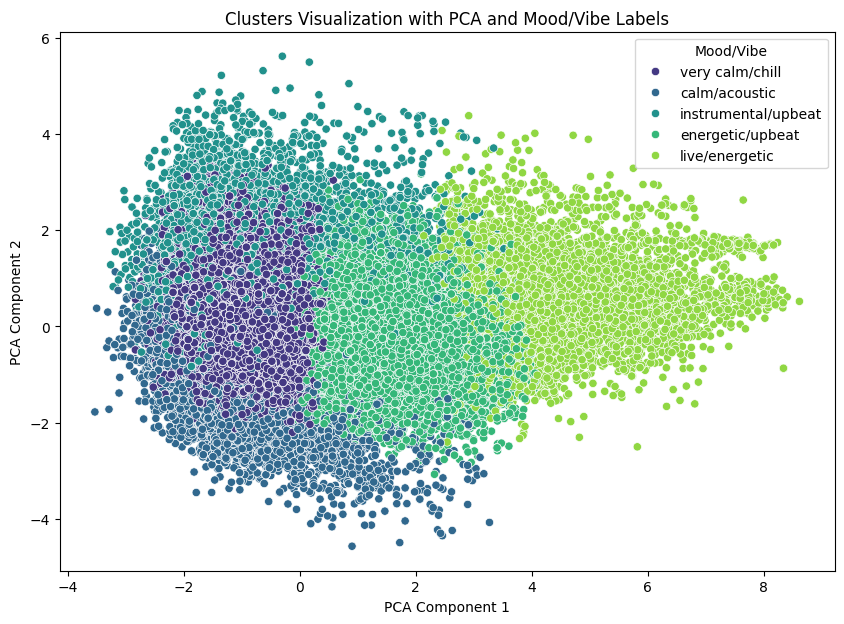

In [ ]:

import numpy as np
# Apply PCA with the chosen number of components
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Apply PCA with the chosen number of components
n_components_optimal = 7
pca = PCA(n_components=n_components_optimal)
pca_features = pca.fit_transform(scaled_features)

# Perform K-means clustering on the PCA-transformed features
k_optimal = 6 # Adjust this based on optimal number of clusters
kmeans_pca = KMeans(n_clusters=k_optimal, random_state=42, n_init=10)
clusters_pca = kmeans_pca.fit_predict(pca_features)

# Add the PCA components and cluster labels to the original data
for i in range(n_components_optimal):
    data[f'pca{i+1}'] = pca_features[:, i]
data['cluster_pca'] = clusters_pca

# Calculate mean values for each feature within each cluster
numeric_features = ['speechiness', 'acousticness', 'instrumentalness', 'loudness', 'liveness', 'danceability', 'energy', 'tempo']
cluster_summary = data.groupby('cluster_pca')[numeric_features].mean()

# Print the summary to manually analyze the clusters
print(cluster_summary)



# Map these labels to the cluster numbers
cluster_labels = {
    0: 'calm/acoustic',
    1: 'very calm/chill',
    2: 'energetic/upbeat',
    3: 'instrumental/upbeat',
    4: 'live/energetic'
}

# Map the labels to the cluster numbers
data['mood_vibe'] = data['cluster_pca'].map(cluster_labels)

# Create a new DataFrame with relevant columns including artist_name, track_name, and album_name
labeled_data = data[['song_id', 'playlist_id', 'track_popularity', 'mood_vibe', 'artist_name', 'track_name', 'album_name']]

# Save the labeled data to a CSV file
labeled_data.to_csv('labeled_songs.csv', index=False)

# Display the head of the new DataFrame
print(labeled_data.head())

# Visualize the clusters with their mood/vibe labels
plt.figure(figsize=(10, 7))
sns.scatterplot(x='pca1', y='pca2', hue='mood_vibe', palette='viridis', data=data)
plt.title('Clusters Visualization with PCA and Mood/Vibe Labels')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Mood/Vibe')
plt.show()

# PCA 8

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


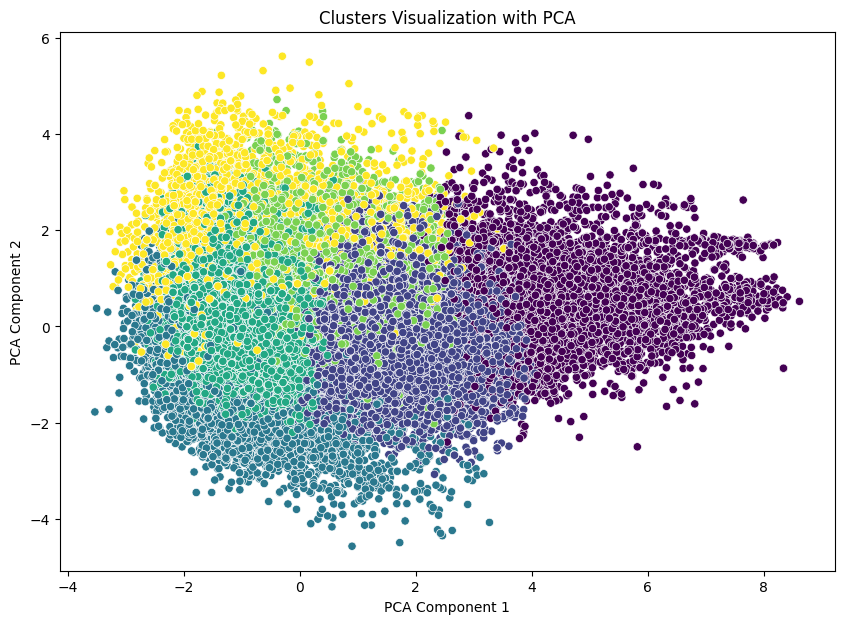

In [ ]:

# Apply PCA with the chosen number of components
n_components_optimal = 8
pca = PCA(n_components=n_components_optimal)
pca_features = pca.fit_transform(scaled_features)

# Perform K-means clustering on the PCA-transformed features
k_optimal = 6  # Adjust this based on your optimal number of clusters
kmeans_pca = KMeans(n_clusters=k_optimal, random_state=42)
clusters_pca = kmeans_pca.fit_predict(pca_features)

# Add the PCA components and cluster labels to the original data
for i in range(n_components_optimal):
    data[f'pca{i+1}'] = pca_features[:, i]
data['cluster_pca'] = clusters_pca

# Plot the PCA-transformed features with cluster labels for the first two components
plt.figure(figsize=(10, 7))
sns.scatterplot(x='pca1', y='pca2', hue='cluster_pca', palette='viridis', data=data, legend=None)
plt.title('Clusters Visualization with PCA')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

# PCA 9

In [ ]:
# Normalize the features


# Apply PCA with the chosen number of components
n_components_optimal = 9
pca = PCA(n_components=n_components_optimal)
pca_features = pca.fit_transform(scaled_features)

# Perform K-means clustering on the PCA-transformed features
k_optimal = 5  # Adjust this based on your optimal number of clusters
kmeans_pca = KMeans(n_clusters=k_optimal, random_state=42)
clusters_pca = kmeans_pca.fit_predict(pca_features)

# Add the PCA components and cluster labels to the original data
for i in range(n_components_optimal):
    data[f'pca{i+1}'] = pca_features[:, i]
data['cluster_pca'] = clusters_pca

# Plot the PCA-transformed features with cluster labels for the first two components
plt.figure(figsize=(10, 7))
sns.scatterplot(x='pca1', y='pca2', hue='cluster_pca', palette='viridis', data=data, legend=None)
plt.title('Clusters Visualization with PCA')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()





ValueError: n_components=9 must be between 0 and min(n_samples, n_features)=8 with svd_solver='full'